In [1]:
import numpy as np
import pandas as pd
import sys
import pickle
import matplotlib as mpl
import matplotlib.pyplot as plt
import time
import PIL
import os
import json
from annoy import AnnoyIndex
import subprocess

import tensorflow
import tensorflow as tf
import tensorflow.keras as keras
import tensorflow.keras.applications as ka
from keras.applications.resnet import decode_predictions

plt.rcParams["figure.dpi"]= 300
mpl.rc('axes.spines',top=False,bottom=False,left=False,right=False);
mpl.rc('axes',facecolor=(0,0,0,0),edgecolor=(0,0,0,0));
mpl.rc(('xtick','ytick'),color=(0,0,0,0));

In [2]:
import numpy as np
import pandas as pd
import sys
import pickle
import matplotlib as mpl
import matplotlib.pyplot as plt
plt.rcParams["figure.dpi"]= 300
mpl.rc('axes.spines',top=False,bottom=False,left=False,right=False);
mpl.rc('axes',facecolor=(0,0,0,0),edgecolor=(0,0,0,0));
mpl.rc(('xtick','ytick'),color=(0,0,0,0));
import time
import PIL
import os
import json
from annoy import AnnoyIndex
import subprocess

import tensorflow
import tensorflow as tf
import tensorflow.keras as keras
import tensorflow.keras.applications as ka
from keras.applications.resnet import decode_predictions

class searchEngine():
    
    def __init__(self, encoding_user_set = 'resnet_1000', combined_weight = 1):
        '''
        The user supplied encoding_user_set argument points the class to a directory containing the proper
        encodings and images.  The set src method sets the proper directories as class attributes.
        
        The init method will also attempt to load a database of encodings.  If it cannot do this, a message
        is printed to the user requesting encodings be generated.
        
        '''

        self.class_key = pd.read_csv('/Users/ChrisPenny/Documents/MPCS53112/project_dir/ImageNet/imagenet_resnet_key.csv')
        self.encoding_type = encoding_user_set
        self.set_src()
        self._tree_count = None
        self._combined_weight = combined_weight
        try:
            self.load_database()
        except:
            print('Must generate encodings for this setting.')

    def brute_force_search_index(self, query_index, num_results, show_flag=True, normalized=False):
        '''
        Performs a brute force search using a numerical index corresponding to one of the 50k images in the
        validation set.  If show_flag is set to true, visual results are returned.
        
        Search is implemented as vectorized numpy operation to take Euclidean distance followed by numpy
        argsort.
        
        Inputs:
        -query_index: integer 0-49,999 denoting place in validaton set.
        -num_results: Integer, number of results to return.  Note that the original image is the first result
        and will be omitted.
        -show_flag: True/false indicator determines if results are shown or simply processed (used in scoring)
        -normalized: True/false indicator of whether or not or not normalization is performed in brute force 
        Euclidean search. Note that for certain encodings normalization is applied when the load_database method
        is called.
        '''
        
        query_vec = self._values[query_index]

        if normalized == True:
            dist_to_query = np.linalg.norm((query_vec/np.linalg.norm(query_vec) - 
                                            np.array(searcher._values)/np.linalg.norm(np.array(searcher._values), axis = 1).reshape(-1, 1)), axis = 1)
        else:
            dist_to_query = np.linalg.norm((query_vec - np.array(self._values)), axis = 1)

        dist_ranking = np.argsort(dist_to_query)
            
        if show_flag == 1:
            self.show_results(query_index, dist_ranking, num_results)
            
    def build_annoy_forest(self, tree_count, seed = 13):
        '''
        Builds an annoy forest ensemble in main memory.
        
        Inputs:
        -tree_count: number of trees to build in ensemble.
        -seed: set seed value for repeatability.
        '''
        
        self._tree_count = tree_count
        
        t = AnnoyIndex(len(self._values[0]), 'euclidean')
        
        t.set_seed(seed)

        for idx, item in enumerate(self._values):
            t.add_item(idx, np.array(item))
        
        # Cannot continue to add items after tree is built.
        t.build(tree_count)
        
        self._annoy_forest = t
            
    def annoy_search_index(self, query_index, num_results, show_flag=True):
        '''
        Performs a brute force search using a numerical index corresponding to one of the 50k images in the
        validation set.  If show_flag is set to true, visual results are returned.
        
        NOTE: Must call the build_annoy_forest method prior to using.
        
        Search is implemented using ANNOY module.
        See: https://github.com/spotify/annoy
        
        Inputs:
        -query_index: integer 0-49,999 denoting place in validaton set.
        -num_results: Integer, number of results to return.  Note that the original image is often the first 
        result and will be omitted.
        -show_flag: true/false indicator determines if results are shown or simply processed (used in scoring)
        '''
        
        query_vec = np.array(self._values[query_index])

        dist_ranking = self._annoy_forest.get_nns_by_vector(query_vec, num_results+1)
        
        if show_flag == True:
            self.show_results(query_index, dist_ranking, num_results)

    def show_results(self, query_idx, dist_rank, num_results, query_filepath = None):
        '''
        Concatenates the query image and search results into a single image and plots in a figure.
        
        Additionally prints class results for the images, including the query, in order.
        
        Inputs:
        -query_index: integer 0-49,999 denoting place in validaton set.
        -dist_rank: numerical ranking of nearest neighbors by index in validation set.
        -num_results: number of results to plot.
        -query_filepath: used instead of query index when showing results based on encoder_search.
        '''
        
        if query_filepath == None:
            query_img = PIL.Image.open(self._image_dir + self._keys[query_idx])
        else:
            query_img = PIL.Image.open(query_filepath)

        # Class code corresponds to pretrained weight class scheme and is parsed from filepath.
        class_code = int(self._keys[query_idx][:self._keys[query_idx].find('/')])
        
        if query_filepath == None:
            print(self.class_key[self.class_key['resnet_class'] == class_code]['resnet_desc'].values[0])

        # Concatenate and print image results.
        concat_img = np.array(query_img.resize((int((600/query_img.height)*query_img.width), 600)))

        for i in range(1, num_results + 1):
            result_idx = dist_rank[i]
            result_img = PIL.Image.open(self._image_dir + self._keys[result_idx])
            result_img = result_img.resize((int((600/result_img.height)*result_img.width), 600))

            if len(np.array(result_img).shape) == 2:
                result_img = np.stack([result_img, result_img, result_img], axis = -1)
            elif np.array(result_img).shape == (224, 224, 4):
                result_img = np.array(result_img)
                result_img = result_img[:, :, 0:3]


            concat_img = np.concatenate([concat_img, np.zeros((600, 60, 3)), result_img], axis = 1)

            class_code = int(self._keys[result_idx][:self._keys[result_idx].find('/')])
            
            print(self.class_key[self.class_key['resnet_class'] == class_code]['resnet_desc'].values[0])
            
        plt.clf()
        plt.imshow(concat_img/255)
        plt.show()
        
    def distributed_search_index(self, query_index, num_results, cluster_id = 'local'):
        '''
        Performs a distributed force search using a numerical index corresponding to one of the 50k 
        images in the validation set.
        
        Inputs:
        -query_index: integer 0-49,999 denoting place in validaton set.
        -num_results: integer, number of results to return
        -cluster_id: true/false indicator determines if results are shown or simply processed (used in scoring)
        '''
        
        query_vec = self._values[query_index]
        
        query_vec_str = ''
        
        for elem in query_vec:
            query_vec_str += str(elem) + ' '
        
        query_vec_str = query_vec_str[:-1]

        f = open("vec.txt","w")
        f.write(query_vec_str)

        # Send to command line - will execute in the shell used to launch Jupyter Notebook.
        subprocess.run("python3 distributed_prototype.py " + 
                           str(self._s3_path) + 
                           " -r emr --cluster-id=" + 
                           str(cluster_id) + 
                           " --no-read-logs --region=us-east-2 --query=vec.txt > output.txt", 
                           shell = True)

        # Parse output and concatenate results into a single image:
        with open('output.txt') as f:
            for line in f:
                out = list(str(line).replace('[','').
                                     replace(']','').
                                     replace(',', '').
                                     replace('"','').
                                     replace('1\t','').
                                     replace('\n', '').split(" "))

        out_paths = out[1::2]

        query_img = PIL.Image.open(self._image_dir + out_paths[0])

        concat_img = np.array(query_img.resize((int((600/query_img.height)*query_img.width), 600)))

        for i in range(1, num_results + 1):
            result_path = out_paths[i]
            result_img = PIL.Image.open(self._image_dir + result_path)
            result_img = result_img.resize((int((600/result_img.height)*result_img.width), 600))

            if len(np.array(result_img).shape) == 2:
                result_img = np.stack([result_img, result_img, result_img], axis = -1)
            elif np.array(result_img).shape == (224, 224, 4):
                result_img = np.array(result_img)
                result_img = result_img[:, :, 0:3]


            concat_img = np.concatenate([concat_img, np.zeros((600, 60, 3)), result_img], axis = 1)

        plt.clf()
        plt.imshow(concat_img/255)
        plt.show()
        
    def load_database(self):
        '''
        Loads a previously generated set of encodings into main memory as a numpy array and a list of the 
        corresponding file paths.
        
        The init method tries to execute this method upon instantiation.
        '''

        with open(self._src) as f:
            db =  json.load(f)

        self._values = np.array([x for x in db.values()])
        self._keys = list(db.keys())
        
        # Special cases requiring extra steps (this is how the combined encodings are assembled):
        if self.encoding_type == 'combined':
            
            resnet_enc_norm = self._values/np.linalg.norm(self._values, axis = 1).reshape(-1, 1)
            
            print(resnet_enc_norm.shape)
            
            self.encoding_type = 'ae_bottleneck_2048'
            self.set_src()
            self.encoding_type = 'combined'
            
            with open(self._src) as f:
                db =  json.load(f)
            
            ae_enc_norm = np.array([x for x in db.values()])/np.linalg.norm(np.array([x for x in db.values()]),
                                                                            axis = 1).reshape(-1, 1)
            
            self._values = np.concatenate([self._combined_weight*resnet_enc_norm, ae_enc_norm], axis = 1)
            
            print(self._values.shape)
            
        elif self.encoding_type == 'resnet_1000_normalized':
            
            self._values = self._values/np.linalg.norm(self._values, axis = 1).reshape(-1, 1)
            
        
    def load_encoder(self):
        '''
        Loads the original model and uses its paramemters to compile the encoding layers.  It is necessary to
        run this step before using the following methods:
            - encoder_search
            - generate_reconstruction
            - generate_encodings
        
        Only available for relevant encoding types.  Note that the models occupy a large amount of space
        in main memory.
        '''
        
        if self.encoding_type == 'resnet_1000' or self.encoding_type == 'resnet_1000_scaled_up':
            self._encoderModel = ka.ResNet50(weights='imagenet',
                                             input_shape = (224, 224, 3))
            
        elif self.encoding_type == 'resnet_2048':
            self._underlyingModel = ka.ResNet50(weights='imagenet',
                                             input_shape = (224, 224, 3))

            self._encoderModel = keras.Model(inputs = self._underlyingModel.input, 
                                             outputs = self._underlyingModel.layers[-2].output)
            
        elif self.encoding_type == 'ae_simple_2048':
            self._underlyingModel = keras.models.load_model(
                                    './models/AE_Simple_F4_0001_Final.h5')

            self._encoderModel = keras.Model(inputs = self._underlyingModel.input, 
                                             outputs = keras.layers.GlobalMaxPool2D()
                                             (self._underlyingModel.layers[-12].output))
            
        elif self.encoding_type == 'ae_dense_2048':
            self._underlyingModel = keras.models.load_model(
                                    './models/AE_Dense_F4_0001_Final.h5')

            self._encoderModel = keras.Model(inputs = self._underlyingModel.input, 
                                             outputs = self._underlyingModel.layers[-9].output)
            
        elif self.encoding_type == 'ae_bottleneck_2048' or self.encoding_type == 'ae_bottleneck_2048_scaled_up':
            self._underlyingModel = keras.models.load_model(
                                    './models/AE_Bottleneck_F4_0001_Final.h5')
    
            self._encoderModel = keras.Model(inputs = self._underlyingModel.input,
                                             outputs = self._underlyingModel.layers[-15].output)
        
        elif self.encoding_type == 'combined':
            
            self._underlyingModel = keras.models.load_model(
                                    './models/AE_Bottleneck_F4_0001_Final.h5')
    
            self._encoderModel = keras.Model(inputs = self._underlyingModel.input,
                                             outputs = self._underlyingModel.layers[-15].output)
        
            self._encoderModel.compile()
            
            self._underlyingModel = ka.ResNet50(weights='imagenet',
                                           input_shape = (224, 224, 3))  
            
            self._underlyingModel.compile()
            
            print('Combined encoders loaded.')
        
        else:
            print('No model matching that encoding type.')
            return

        self._encoderModel.compile()

    def prep_image(self, path):
        '''
        Prepares an input image for use in the encoder_search method.
        Basically a preprocessing step that reads in the image, resizes it,
        and ensures that the model receives something with 3 dimensions in the
        event the image is grayscale (there are a very limited few in the dataset as well as 
        images with seemingly rearranged color channels).
        
        Inputs:
        -path: path to image
        '''
    
        im = PIL.Image.open(path)
        
        im_resize = im.resize((224, 224))
        
        if np.array(im_resize).shape == (224, 224):
            im_resize = np.stack([im_resize, im_resize, im_resize], axis = -1)
            
        elif np.array(im_resize).shape == (224, 224, 4):
            im_resize = np.array(im_resize)
            im_resize = im_resize[:, :, 0:3]
        
        return np.array(im_resize).reshape((1, 224, 224, 3))
    
    def encoder_search(self, query_path, num_results, show = 1):
        '''
        Performs a search based on a filepath to the query image.  Must load an encoder before use.
        Sometimes fails on non-3 channel images.
        
        Inputs:
        -query_path: filepath to query image.
        -num_results: number of search results to show.
        -show: whether or not to show results in a concatenated image.
        '''
        
        np_image = self.prep_image(query_path)
        
        if self.encoding_type == "combined":
            resnet_encoding = self._underlyingModel.predict(np_image)
            ae_encoding = self._encoderModel.predict(np_image)
            # Normalize:
            resnet_enc_norm = resnet_encoding/np.linalg.norm(resnet_encoding).reshape(-1, 1)
            ae_enc_norm = ae_encoding/np.linalg.norm(ae_encoding).reshape(-1, 1)
            query_encoding = np.concatenate([self._combined_weight*resnet_enc_norm, ae_enc_norm], axis = 1)
            
        else:
            query_encoding = self._encoderModel.predict(np_image)

        # Brute force method:
        dist_to_query = np.linalg.norm((query_encoding[0] - self._values), axis = 1)
        dist_ranking = np.argsort(dist_to_query)

        self.show_results(0, dist_ranking, num_results, query_filepath = query_path)
            
    def generate_reconstruction(self, image_path):
        '''
        Generate a reconstructed images by passing through an autoencoder model.
        
        Note that in order to show parity between the input and the reconstructed image,
        we plot the resized 224 x 224 x 3 image in both cases.
        
        Requires an autoencoder model to be loaded.
        
        Inputs:
        -image_path: filepath to image to be reconstructed.
        '''
        
        if self.encoding_type not in {"ae_bottleneck_2048", "ae_dense_2048", "ae_simple_2048"}:
            print("Reconstruction is only available for autoencoder models.")
            
        else:
            np_image = self.prep_image(image_path)
            
            plt.clf()
            plt.imshow(np_image[0]/255)
            plt.show()
            
            reconstructed_image = self._underlyingModel(np_image)
        
            plt.clf()
            plt.imshow(reconstructed_image[0]/255)
            plt.show()
            
    def save_scores(self, search_mode = 'annoy', normalized = False, ranks = [5, 10, 20, 50], sample = False, sample_size = 10000):
        '''
        Records within-class precision scores for each input rank and saves to a text file.
        Futher processing is conducted in the Plots and Analysis notebook.
        
        Has the option to use a sample of the full validation partition.  Samples are taken with replacement.
        
        Inputs:
        -search_mode: specify the search implementation to be used for scoring.
        -normalized: toggle whether to normalize encoding.
        -ranks: rank or number of search results at which we measure precision.
        -sample: whether or not to use a sample instead of all 50k validation images.
        -sample_size: if sample is True, then how many samples to use.
        '''
        
        # Precompute normalization of each encoding:
        if normalized == True:
            self._values_normed = self._values/np.linalg.norm(self._values, axis = 1).reshape(-1, 1)

        # Dictionary keeps track of scores by class:
        score_dict = {}

        # Sample or not:
        if sample == True:
            rand_index = np.random.randint(0, 50000, (sample_size,))
        else:
            rand_index = range(50000)
            
        # Scoring loop:
        for ct, idx in enumerate(rand_index):
            
            if ct % 1000 == 0:
                print(ct)

            query_vec = self._values[idx]
            query_key = self._keys[idx]
            query_class = query_key[:query_key.find('/')]

            start_time = time.time()

            if search_mode == 'brute_force':
                if normalized == True:
                    dist_to_query = np.linalg.norm((query_vec/np.linalg.norm(query_vec) - 
                                                    self._values_normed), 
                                                    axis = 1)
                else:
                    dist_to_query = np.linalg.norm(query_vec - self._values, 
                                                   axis = 1)   
                dist_ranking = np.argsort(dist_to_query)
            elif search_mode == 'annoy':
                dist_ranking = self._annoy_forest.get_nns_by_vector(query_vec, np.max(ranks) + 1)
            else:
                print("Not a valid search mode")
                return

            end_time = time.time()

            # Compare classes:
            correct = 0
            rank_idx = 0
            # Note: First result is the image itself, so we skip it.
            for jdx in range(1, np.max(ranks) + 1):

                result_key = self._keys[dist_ranking[jdx]]
                result_class = result_key[:result_key.find('/')]

                if result_class == query_class:
                    correct += 1

                if ranks[rank_idx] == jdx:

                    if query_class not in score_dict:
                        score_dict[query_class] = {}
                        score_dict[query_class][ranks[rank_idx]] = []
                    elif ranks[rank_idx] not in score_dict[query_class]:
                        score_dict[query_class][ranks[rank_idx]] = []

                    score_dict[query_class][ranks[rank_idx]].append(correct/ranks[rank_idx])

                    rank_idx += 1
                
                score_dict['time'] = end_time - start_time
        
        # Write results to text file:
        if search_mode == 'annoy' and self._combined_weight == 1:
            with open("./scores/" + search_mode + "_" + str(self._tree_count) + "_" + self.encoding_type + "_scores.txt", 'w') as outfile:
                json.dump(score_dict, outfile)
        elif search_mode == 'annoy' and self._combined_weight == 0.4:
            with open("./scores/" + search_mode + "_" + str(self._tree_count) + "_" + self.encoding_type + "_0.4_scores.txt", 'w') as outfile:
                json.dump(score_dict, outfile)
        else:
            if normalized == True:
                with open("./scores/" + search_mode + "_normalized_" + self.encoding_type + "_scores.txt", 'w') as outfile:
                    json.dump(score_dict, outfile)
            elif self._combined_weight == 0.4:
                with open("./scores/" + search_mode + "_" + self.encoding_type + "_0.4_scores.txt", 'w') as outfile:
                    json.dump(score_dict, outfile)
            else:
                with open("./scores/" + search_mode + "_" + self.encoding_type + "_scores.txt", 'w') as outfile:
                    json.dump(score_dict, outfile)         


    def score_runtimes(self, search_mode, c_id = None):
        '''
        Score methods with respect to runtime on ResNet 1000 dataset.
        
        NOTE: If you want to use this with the distributed search, it is advisable to use 100 loops instead of 
        50k.
        
        Inputs:
        -search_mode: choose 'brute_force', 'annoy', or 'distributed' for scoring.
        -c_id: cluster id to submit job to.  Must be in Region East 2. Only required for 'distributed' search.
        
        Returns:
        -average runtime and variance.
        '''
        
        runtimes = []
        rand_index = np.random.randint(0, 50000, (50000,))

        # Loop through all validation partition items:
        for i in range(50000):
            
            idx = rand_index[i]
            
            query_vec = self._values[idx]
            query_key = self._keys[idx]
            query_class = query_key[:query_key.find('/')]
            
            start_time = time.time()

            if search_mode == 'brute_force':

                dist_to_query = np.linalg.norm((query_vec - self._values), 
                                               axis = 1)   
                dist_ranking = np.argsort(dist_to_query)
            elif search_mode == 'annoy':
                dist_ranking = self._annoy_forest.get_nns_by_vector(query_vec, 50)
            elif search_mode == 'distributed':
                self.distributed_search(idx, 50, cluster_id = c_id)
            else:
                print("Not a valid search mode")
                return

            end_time = time.time()
            
            runtimes.append(end_time - start_time)
        return np.mean(runtimes), np.var(runtimes)
            
        
    def generate_encodings(self):
        '''
        Generates encodings based on user supplied encoding type and loaded encoder.
        
        Be careful when using this functionality - it will overwrite existing encodings based on
        the current source settings. (Check with get_src method.)
        '''

        files_all = []
        
        # Scaled up implementation ultimately not completed in time.
        if self.encoding_type != 'ae_bottleneck_2048_scaled_up' and self.encoding_type != 'resnet_1000_scaled_up':
            for i in range(1,1001):
                try:
                    files = os.listdir(self._image_dir + str(i))  # Get all the files in that directory
                    files_all += [str(i) + '/' + x for x in files]
                except:
                    pass
        else:
            for class_folder in self.class_key['train_id'].values:
                
                files = os.listdir(self._image_dir + class_folder)  # Get all the files in that directory
                files_all += [class_folder + '/' + x for x in files]
            
        # Stores encodings and written to JSON:
        encodings_dict = {}

        # Loop to process images and store in dictionary, encodings keyed by filename:
        for idx in range(len(files_all)):

            if idx % 1000 == 0:
                print(idx)
            
            try:
                path = self._image_dir + files_all[idx]
                im = PIL.Image.open(path)
                im_resize = im.resize((224, 224))
                if np.array(im_resize).shape == (224, 224):
                    im_resize = np.stack([im_resize, im_resize, im_resize], axis = -1)
                elif np.array(im_resize).shape == (224, 224, 4):
                    im_resize = np.array(im_resize)
                    im_resize = im_resize[:, :, 0:3]
                np_im = np.array(im_resize).reshape((1, 224, 224, 3))

                out = self._encoderModel.predict(np_im)

                encodings_dict[files_all[idx]] = list([float(x) for x in out[0]])
            except:
                print('Skipping one image.')
    
        with open(self._src, 'w') as outfile:
            json.dump(encodings_dict, outfile)
        
    def set_src(self):
        '''
        Sets a hardcoded path according to user encoding type setting.
        '''
        
        if self.encoding_type == 'resnet_1000':
            self._src = './encodings/resnet50_validation_1000.txt'
            self._image_dir = './ImageNet/organized_validation_resnet/'
        elif self.encoding_type == 'resnet_1000_normalized':
            self._src = './encodings/resnet50_validation_1000.txt'
            self._image_dir = './ImageNet/organized_validation_resnet/'
        elif self.encoding_type == 'resnet_2048':
            self._src = './encodings/resnet50_validation_2048.txt'
            self._image_dir = './ImageNet/organized_validation_resnet/'
        elif self.encoding_type == 'ae_simple_2048':
            self._src = './encodings/ae_simple_validation_2048.txt'
            self._image_dir = './ImageNet/organized_validation_resnet/'
        elif self.encoding_type == 'ae_dense_2048':
            self._src = './encodings/ae_dense_validation_2048.txt'
            self._image_dir = './ImageNet/organized_validation_resnet/'
        elif self.encoding_type == 'ae_bottleneck_2048':
            self._src = './encodings/ae_bottleneck_validation_2048.txt'
            self._image_dir = './ImageNet/organized_validation_resnet/'
        elif self.encoding_type == 'combined':
            self._src = './encodings/resnet50_validation_1000.txt'
            self._image_dir = './ImageNet/organized_validation_resnet/'

        
    def get_src(self):
        '''
        Source attribute getter method.
        '''
        return self._src
        

In [3]:
# Instantiate a searchEngine object for each encoding type:

resnet_1000_searcher = searchEngine('resnet_1000')
resnet_2048_searcher = searchEngine('resnet_2048')
ae_bottleneck_searcher = searchEngine('ae_bottleneck_2048')
ae_dense_searcher = searchEngine('ae_dense_2048')
ae_simple_searcher = searchEngine('ae_simple_2048')

Must generate encodings for this setting.
Must generate encodings for this setting.
Must generate encodings for this setting.
Must generate encodings for this setting.
Must generate encodings for this setting.


In [4]:
# Load encoders for all models (necessary for encoder_search method and to generate encodings):

# Should be noted that loading all of the models at once takes a lot of RAM.

resnet_1000_searcher.load_encoder()
resnet_2048_searcher.load_encoder()
ae_bottleneck_searcher.load_encoder()
ae_dense_searcher.load_encoder()
ae_simple_searcher.load_encoder()

In [5]:
## GENERATE ENCODINGS:
# Note that we do not need to generate encodings for the Combined cases - we just use the encodings already made.
resnet_1000_searcher.generate_encodings()
resnet_2048_searcher.generate_encodings()
ae_bottleneck_searcher.generate_encodings()
ae_dense_searcher.generate_encodings()
ae_simple_searcher.generate_encodings()


0
0
0
0
0


In [6]:
# Re-Instantiate Classes now that we have encodings:

resnet_1000_searcher = searchEngine('resnet_1000')
resnet_2048_searcher = searchEngine('resnet_2048')
combined_searcher = searchEngine('combined')
combined_weighted_searcher = searchEngine('combined', combined_weight = 0.40)
ae_bottleneck_searcher = searchEngine('ae_bottleneck_2048')
ae_dense_searcher = searchEngine('ae_dense_2048')
ae_simple_searcher = searchEngine('ae_simple_2048')

(500, 1000)
(500, 3048)
(500, 1000)
(500, 3048)


In [7]:
# Reload encoders for all models (necessary for encoder_search method and to generate encodings):

resnet_1000_searcher.load_encoder()
resnet_2048_searcher.load_encoder()
combined_searcher.load_encoder()
combined_weighted_searcher.load_encoder()
ae_bottleneck_searcher.load_encoder()
ae_dense_searcher.load_encoder()
ae_simple_searcher.load_encoder()

Combined encoders loaded.
Combined encoders loaded.


ResNet 1000 -----------------
hammerhead
hammerhead
hammerhead
marmoset
worm_fence


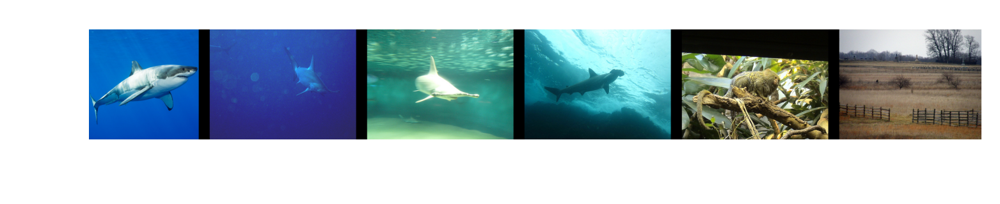

ResNet 2048 -----------------
hammerhead
hammerhead
hammerhead
hammerhead
hammerhead


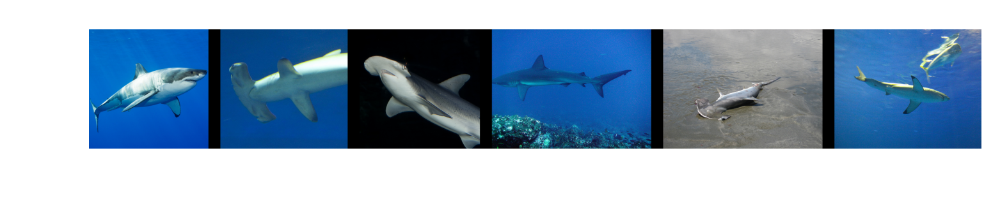

Combined 3048 ---------------
hammerhead
hammerhead
hammerhead
hammerhead
hammerhead


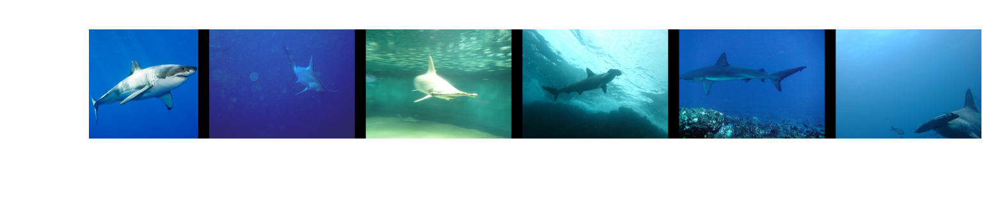

Combined Weighted -----------
hammerhead
hammerhead
hammerhead
hammerhead
hammerhead


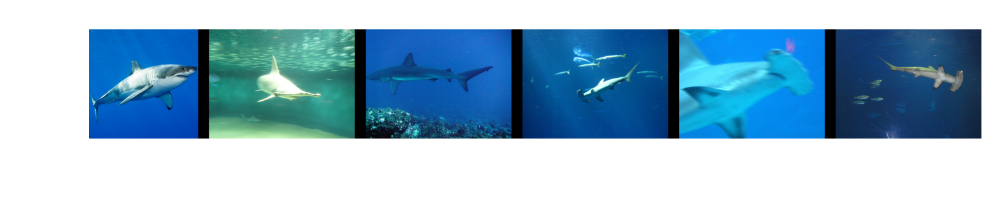

AE Bottleneck ---------------
hammerhead
hammerhead
hammerhead
hammerhead
hammerhead


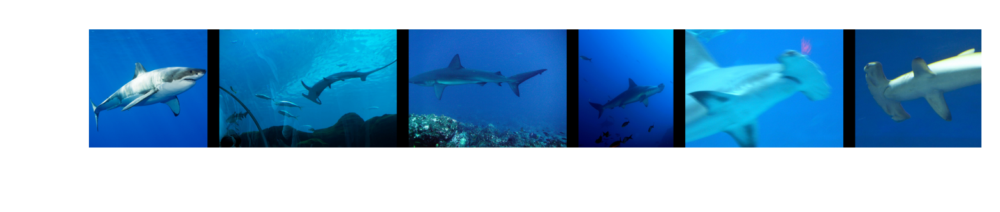

AE Dense --------------------
hammerhead
hammerhead
hammerhead
hammerhead
hammerhead


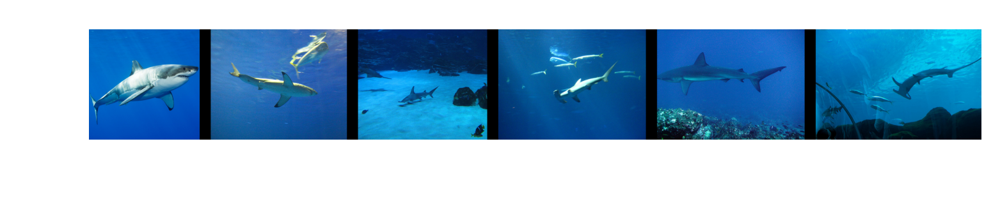

AE Simple -------------------
hammerhead
hammerhead
hammerhead
hammerhead
hammerhead


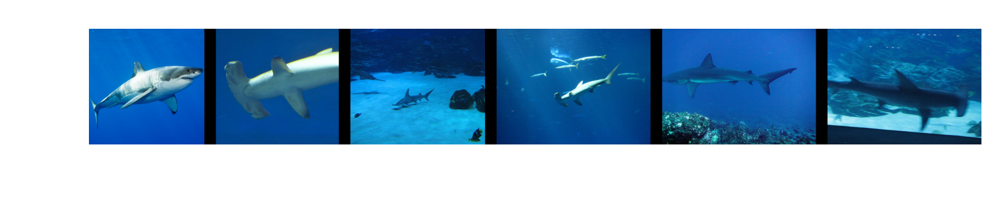

In [8]:
## EXAMPLES USING NON-IMAGENET IMAGES
# Note that many still represent content found in imagenet (automobile, shark, etc.)
# Actual image classes are printed out.

query_paths = [ "./test_query_image.jpg"
              ]

for query_img_path in query_paths:
    print('ResNet 1000 -----------------')
    resnet_1000_searcher.encoder_search(query_img_path, 5)
    print('ResNet 2048 -----------------')
    resnet_2048_searcher.encoder_search(query_img_path, 5)
    print('Combined 3048 ---------------')
    combined_searcher.encoder_search(query_img_path, 5)
    print('Combined Weighted -----------')
    combined_weighted_searcher.encoder_search(query_img_path, 5)
    print('AE Bottleneck ---------------')
    ae_bottleneck_searcher.encoder_search(query_img_path, 5)
    print('AE Dense --------------------')
    ae_dense_searcher.encoder_search(query_img_path, 5)
    print('AE Simple -------------------')
    ae_simple_searcher.encoder_search(query_img_path, 5)

ResNet 1000 ---------------
ostrich
stupa
anemone_fish
anemone_fish
container_ship
anemone_fish
worm_fence
anemone_fish
stupa
marmoset
hammerhead


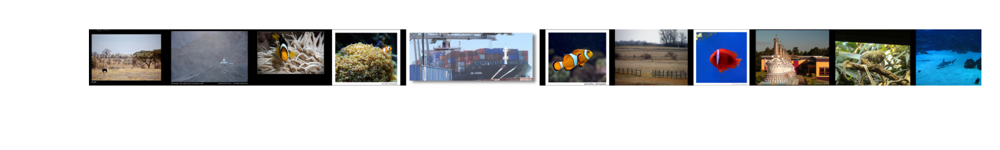

Combined Weighted ---------
ostrich
stupa
anemone_fish
worm_fence
cabbage_butterfly
container_ship
ostrich
worm_fence
marmoset
worm_fence
space_bar


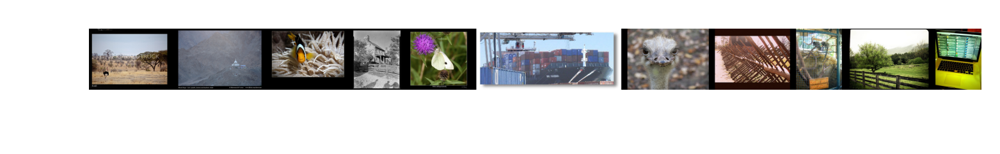

ResNet 1000 ---------------
marmoset
marmoset
marmoset
marmoset
marmoset
worm_fence
marmoset
marmoset
worm_fence
anemone_fish
hammerhead


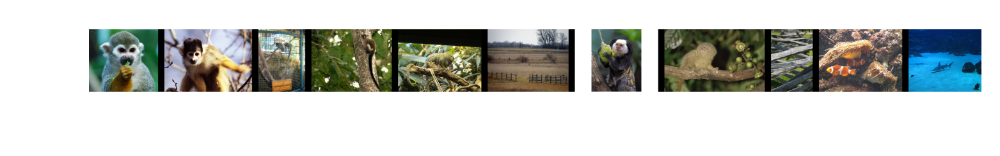

Combined Weighted ---------
marmoset
marmoset
marmoset
marmoset
marmoset
marmoset
marmoset
cabbage_butterfly
worm_fence
cabbage_butterfly
marmoset


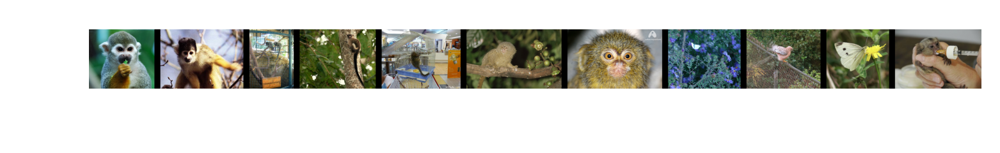

ResNet 1000 ---------------
space_bar
worm_fence
space_bar
hammerhead
anemone_fish
marmoset
hammerhead
hammerhead
hammerhead
cabbage_butterfly
cabbage_butterfly


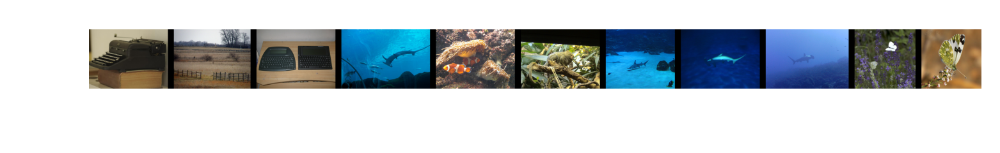

Combined Weighted ---------
space_bar
space_bar
space_bar
space_bar
worm_fence
space_bar
worm_fence
space_bar
ostrich
space_bar
space_bar


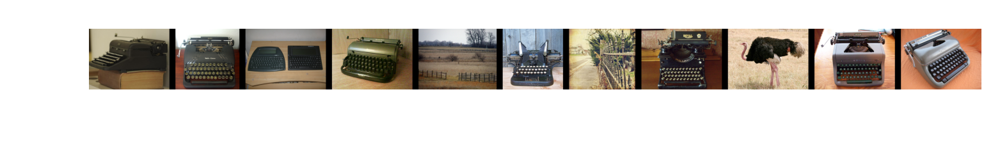

ResNet 1000 ---------------
anemone_fish
anemone_fish
anemone_fish
anemone_fish
anemone_fish
anemone_fish
anemone_fish
anemone_fish
anemone_fish
anemone_fish
anemone_fish


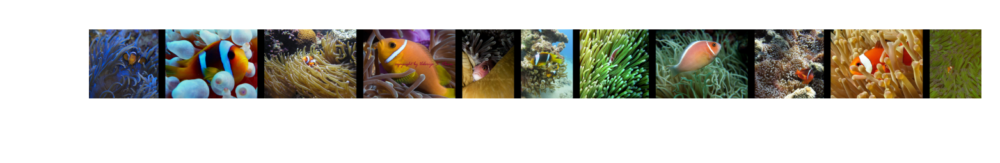

Combined Weighted ---------
anemone_fish
anemone_fish
anemone_fish
anemone_fish
anemone_fish
anemone_fish
anemone_fish
anemone_fish
anemone_fish
anemone_fish
anemone_fish


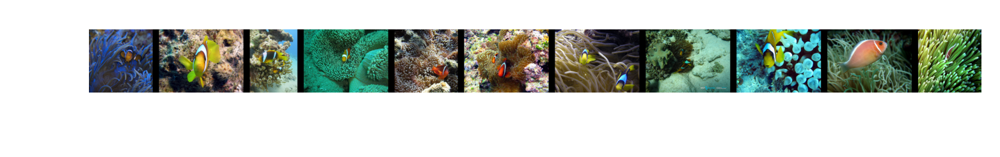

ResNet 1000 ---------------
stupa
stupa
stupa
stupa
stupa
stupa
stupa
stupa
stupa
stupa
stupa


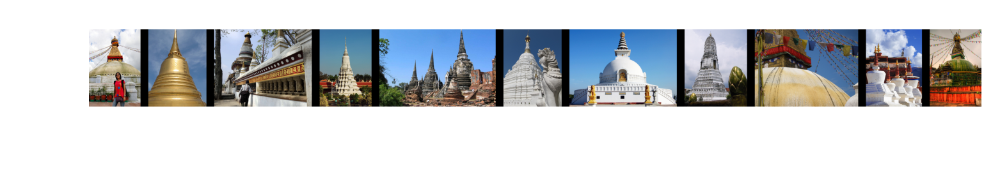

Combined Weighted ---------
stupa
stupa
stupa
stupa
stupa
stupa
stupa
stupa
stupa
stupa
stupa


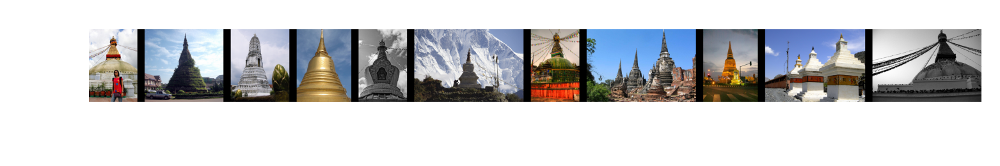

ResNet 1000 ---------------
German_short-haired_pointer
German_short-haired_pointer
German_short-haired_pointer
German_short-haired_pointer
German_short-haired_pointer
German_short-haired_pointer
worm_fence
German_short-haired_pointer
marmoset
German_short-haired_pointer
hammerhead


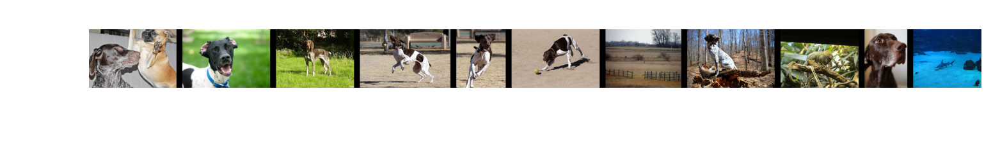

Combined Weighted ---------
German_short-haired_pointer
German_short-haired_pointer
German_short-haired_pointer
German_short-haired_pointer
German_short-haired_pointer
German_short-haired_pointer
ostrich
German_short-haired_pointer
cabbage_butterfly
German_short-haired_pointer
German_short-haired_pointer


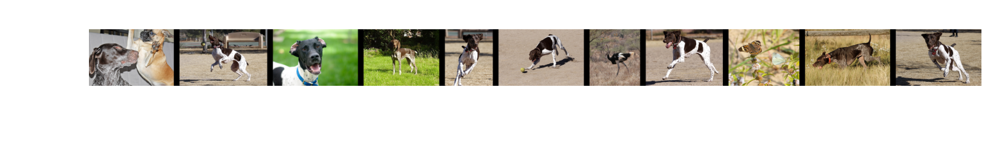

ResNet 1000 ---------------
worm_fence
worm_fence
hammerhead
marmoset
anemone_fish
hammerhead
worm_fence
hammerhead
hammerhead
cabbage_butterfly
cabbage_butterfly


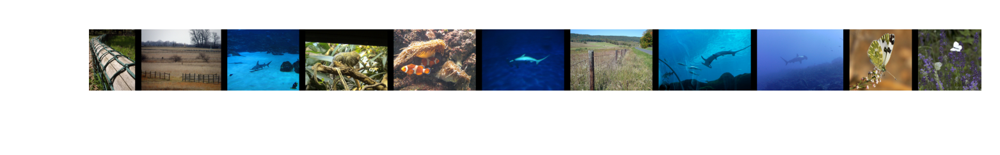

Combined Weighted ---------
worm_fence
marmoset
space_bar
cabbage_butterfly
worm_fence
ostrich
worm_fence
ostrich
marmoset
marmoset
marmoset


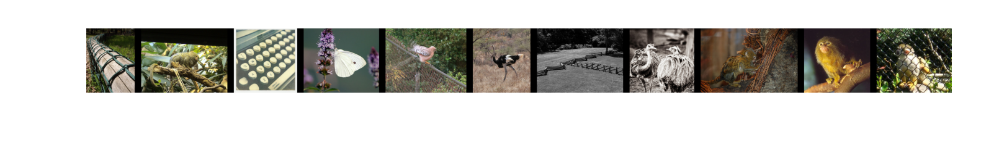

ResNet 1000 ---------------
ostrich
marmoset
worm_fence
anemone_fish
ostrich
hammerhead
hammerhead
hammerhead
hammerhead
cabbage_butterfly
worm_fence


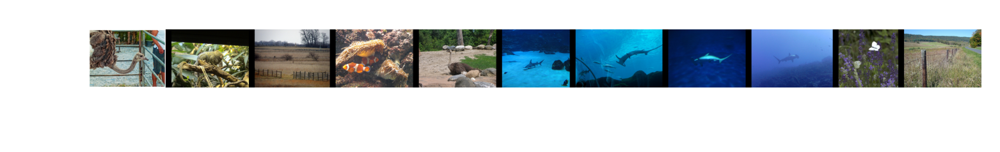

Combined Weighted ---------
ostrich
stupa
space_bar
ostrich
space_bar
ostrich
ostrich
ostrich
ostrich
ostrich
ostrich


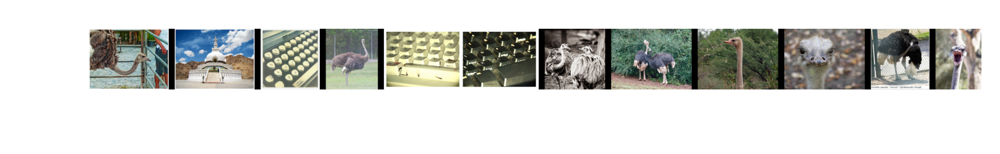

ResNet 1000 ---------------
anemone_fish
hammerhead
hammerhead
marmoset
anemone_fish
hammerhead
hammerhead
anemone_fish
worm_fence
marmoset
anemone_fish


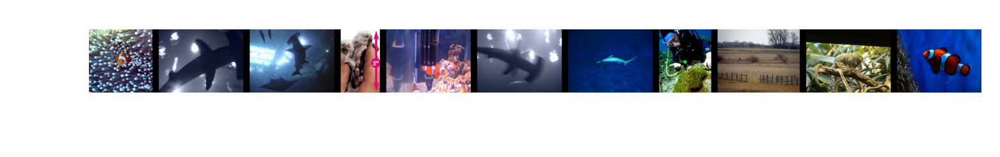

Combined Weighted ---------
anemone_fish
hammerhead
marmoset
anemone_fish
hammerhead
hammerhead
hammerhead
marmoset
space_bar
cabbage_butterfly
anemone_fish


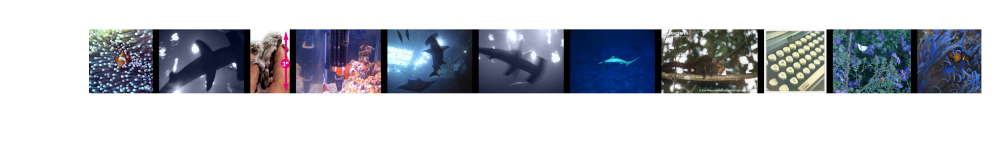

ResNet 1000 ---------------
worm_fence
worm_fence
worm_fence
worm_fence
stupa
worm_fence
worm_fence
worm_fence
worm_fence
hammerhead
marmoset


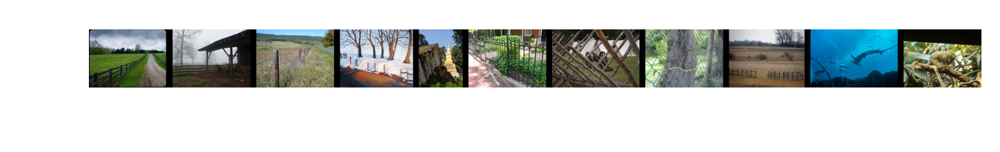

Combined Weighted ---------
worm_fence
worm_fence
worm_fence
worm_fence
worm_fence
worm_fence
worm_fence
worm_fence
container_ship
worm_fence
worm_fence


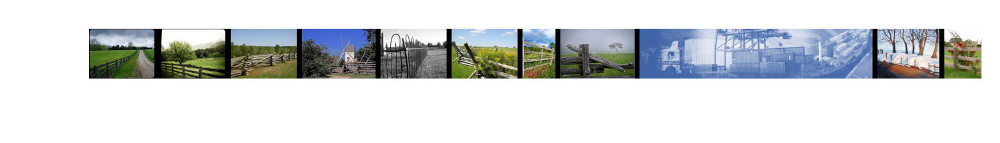

In [9]:
rand_idxs = np.random.randint(0, 500, (10,))    

for idx in rand_idxs:
    
    print('ResNet 1000 ---------------')
    resnet_1000_searcher.brute_force_search_index(idx, 10)
    print('Combined Weighted ---------')
    combined_weighted_searcher.brute_force_search_index(idx, 10)


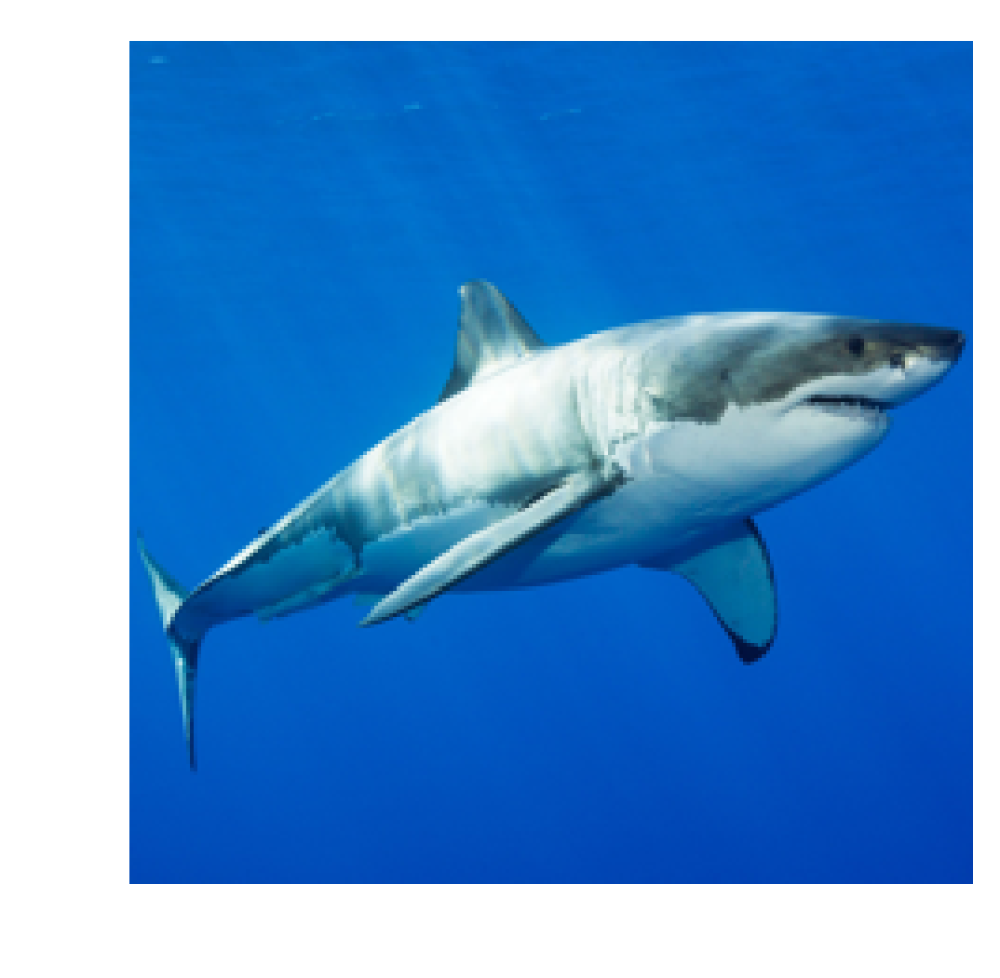

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


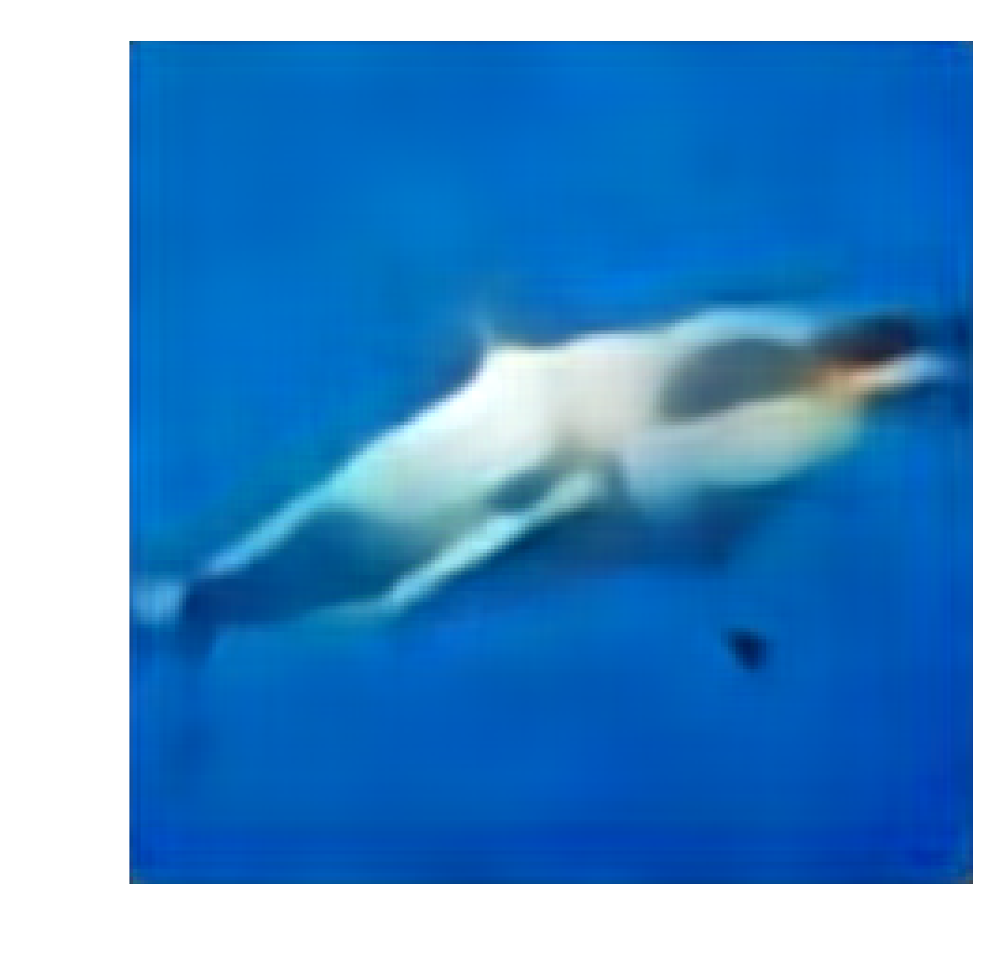

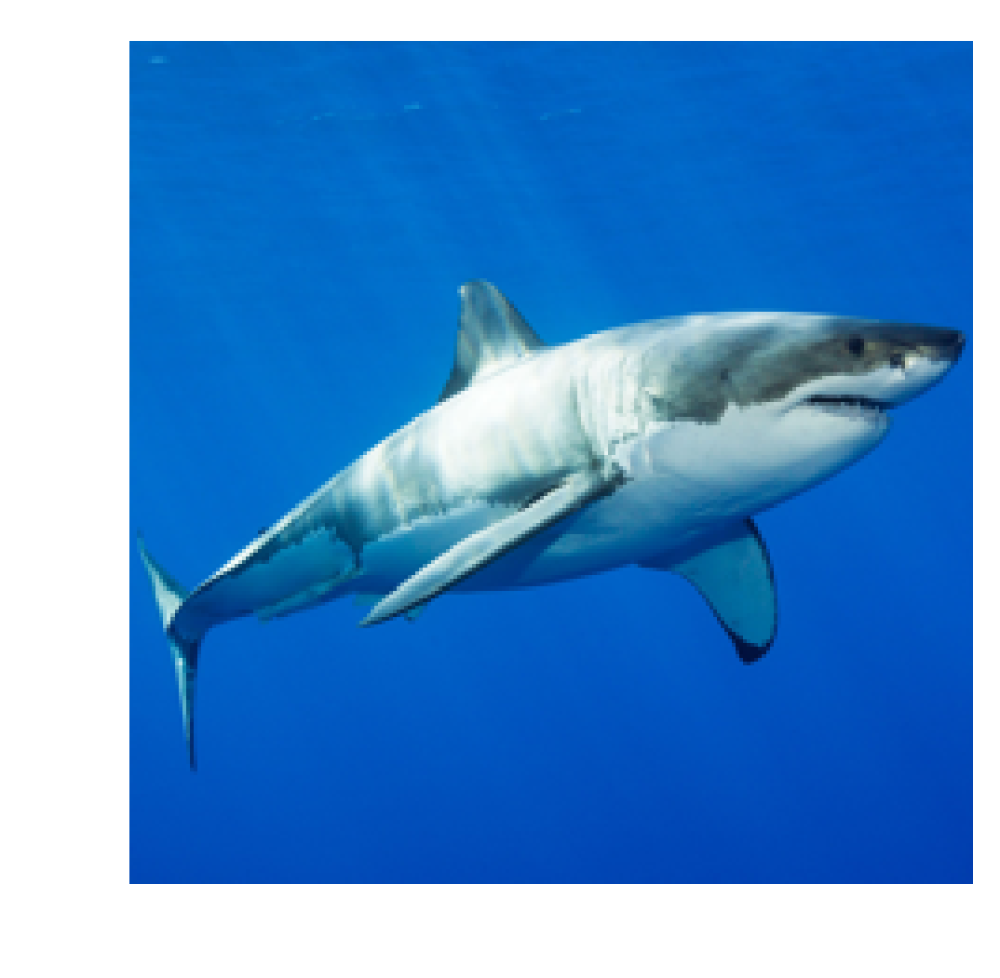

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


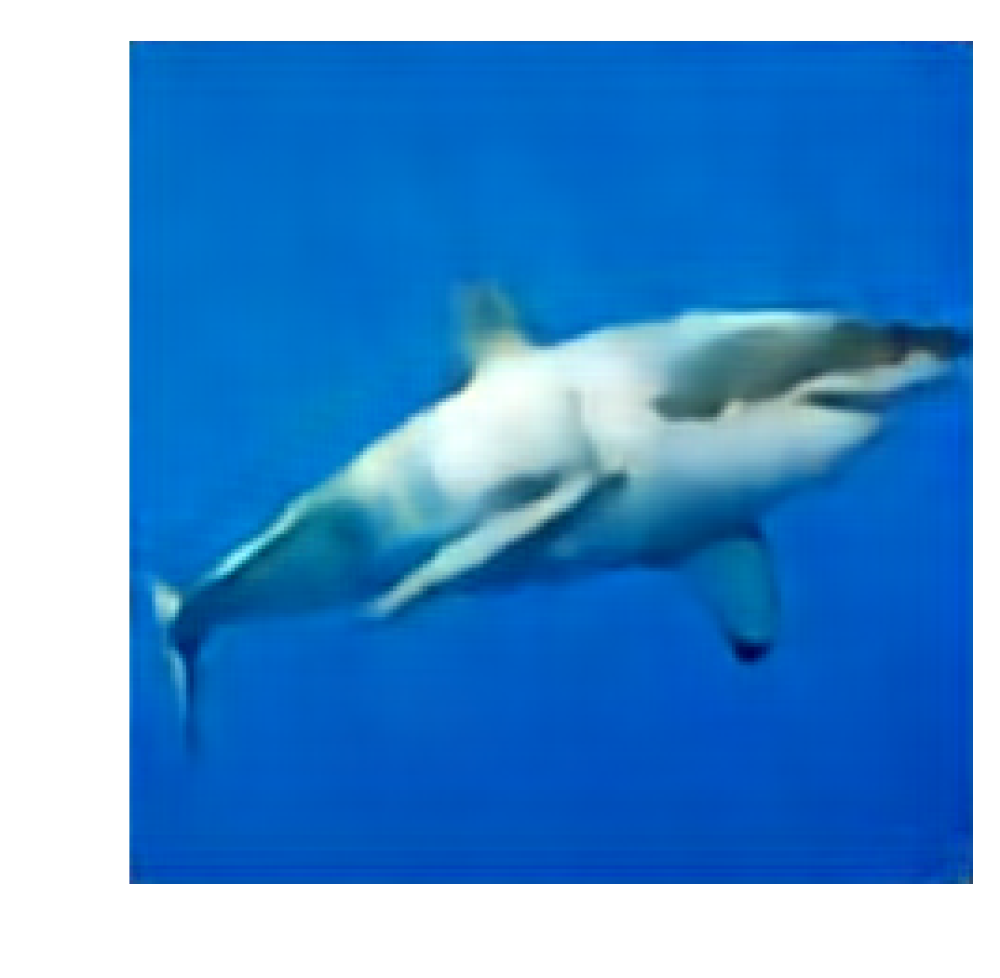

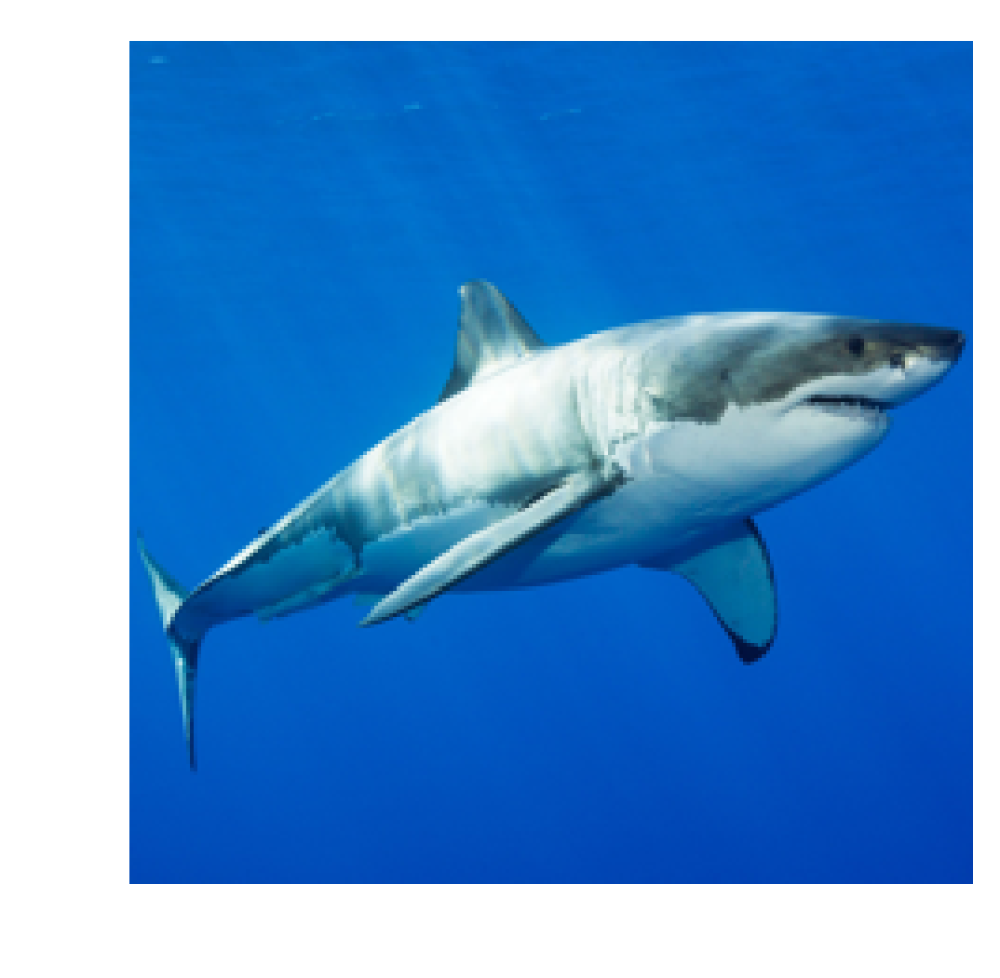

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


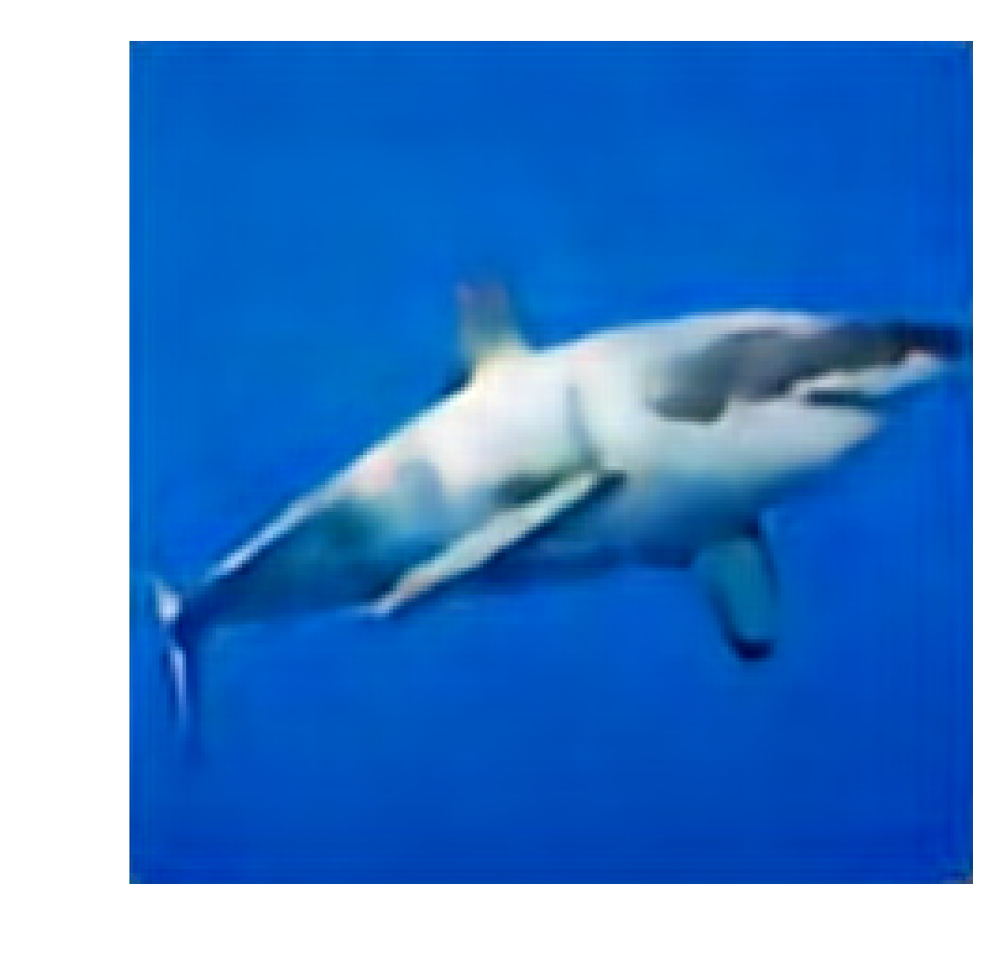

In [10]:
## GENERATE SAMPLE RECONSTRUCTIONS:

ae_bottleneck_searcher.generate_reconstruction("./test_query_image.jpg")
ae_dense_searcher.generate_reconstruction("./test_query_image.jpg")
ae_simple_searcher.generate_reconstruction("./test_query_image.jpg")